In [5]:
# exam05 사본저장해서 살짝 바꾸는 버전
import os
import matplotlib.pyplot as plt
import numpy as np
from keras.models import *
from keras.layers import *
from keras.datasets import mnist

In [6]:
#상수선언
OUT_DIR = './CNN_out'
img_shape = (28, 28, 1)
epochs = 100000
batch_size = 128
noise = 100
sample_interval = 100       # 100마다 샘플뽑아서 저장

In [7]:
# 내 번호로
(x_train, y_train), (_, _) = mnist.load_data()     # _ == ytrain, xtest, ytest 필요없어서 _로 표시
# print(x_train.shape)
MY_NUMBER = 2       # 강사님은 0으로 나는2 손글씨. 학습을 시킬때 자기넘버만 가지고

x_train = x_train[y_train == MY_NUMBER ] #와이 트레인의 값이 내 숫자 인덱싱하려고 필요한 것 
x_train = x_train / 127.5 - 1   # -1 에서 1 사이의 값이 나옴
x_train = np.expand_dims(x_train, axis=3)   # expand_dims : 익스펜드 디멘션 -> 차원을 하나 늘려라
print(x_train.shape)

(5958, 28, 28, 1)


In [8]:
# 강사님 제너레이터
generator = Sequential()
generator.add(Dense(256*7*7, input_dim=noise))
generator.add(Reshape((7, 7, 256)))
generator.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(alpha=0.01))
generator.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same'))
generator.add(Activation('tanh'))
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1266944   
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 128)      295040    
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 14, 14, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 14, 14, 64)       7

In [9]:
# 제너레이터
# generator = Sequential()
# generator.add(Dense(256*7*7, input_dim=noise))  # 레이어 100개      # activation='leaky_relu'
# generator.add(Reshape((7, 7, 256)))             # 콘브했다가 맥스풀 # 튜플 형태로 주기 위해 괄호 한번 더
# generator.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))          # 콘브2d와 어셉? 한번에
# generator.add(BatchNormalization())
# generator.add(LeakyReLU(alpha=0.01))
# generator.add(Reshape((7, 7, 256)))             # 바로 위 3줄 복붙
# generator.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))          # 콘브2d와 어셉? 한번에
# generator.add(BatchNormalization())
# generator.add(LeakyReLU(alpha=0.01)) 
# generator.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same')
# generator.add(Activation('tanh'))
# generator.summary()

# generator.add(LeakyReLU(alpha=0.01)) # 진한 부분만 보고 처리할라고 리키렐루에 적용
# generator.add(Dense(784, activation='tanh'))  # 하이퍼볼릭 탄젠트: 마이너스 값이라서 tanh을 적용
# generator.add(Reshape(img_shape))
# generator.summary()

In [10]:
discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=img_shape))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
discriminator.add(LeakyReLU(alpha=0.01))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 32)        320       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 64)          18496     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 128)         0         
                                                                 
 flatten (Flatten)           (None, 2048)             

In [11]:
discriminator.compile(loss='binary_crossentropy', optimizer='adam',
                      metrics=['accuracy'])
discriminator.trainable = False

gan_model =Sequential()
gan_model.add(generator)
gan_model.add(discriminator)
gan_model.summary()
gan_model.compile(loss='binary_crossentropy', optimizer='adam')

real = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 28, 28, 1)         1637121   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 94721     
                                                                 
Total params: 1,731,842
Trainable params: 1,636,737
Non-trainable params: 95,105
_________________________________________________________________


4/4 [==============================] - 8s 5ms/step
0, [D loss: 0.706824, acc.: 0.71%], [G loss: 0.626144]
1/1 [==============================] - 0s 150ms/step


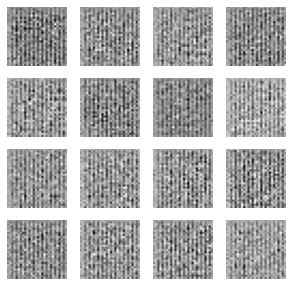

4/4 [==============================] - 0s 4ms/step
100, [D loss: 0.000041, acc.: 0.00%], [G loss: 0.779014]
1/1 [==============================] - 0s 16ms/step


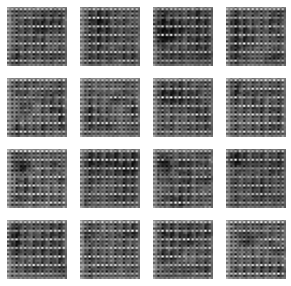

4/4 [==============================] - 0s 3ms/step
200, [D loss: 0.000045, acc.: 0.00%], [G loss: 0.000239]
1/1 [==============================] - 0s 13ms/step


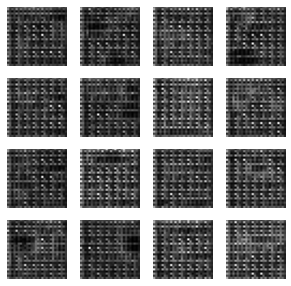

4/4 [==============================] - 0s 6ms/step
300, [D loss: 8.800717, acc.: 8.80%], [G loss: 0.000000]
1/1 [==============================] - 0s 15ms/step


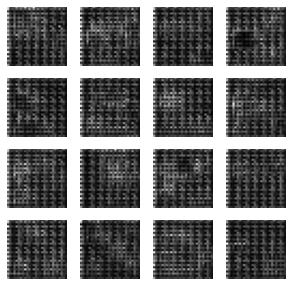

4/4 [==============================] - 0s 5ms/step
400, [D loss: 0.008789, acc.: 0.01%], [G loss: 0.945038]
1/1 [==============================] - 0s 14ms/step


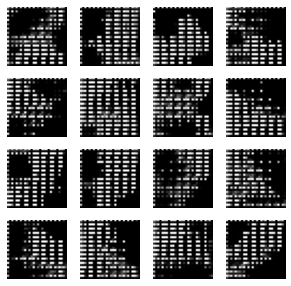

4/4 [==============================] - 0s 6ms/step
500, [D loss: 0.000173, acc.: 0.00%], [G loss: 1.307565]
1/1 [==============================] - 0s 18ms/step


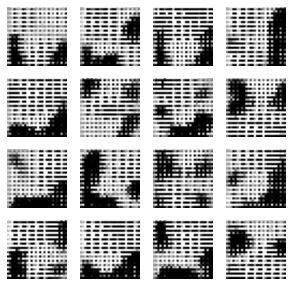

4/4 [==============================] - 0s 6ms/step
600, [D loss: 0.019746, acc.: 0.02%], [G loss: 0.096083]
1/1 [==============================] - 0s 14ms/step


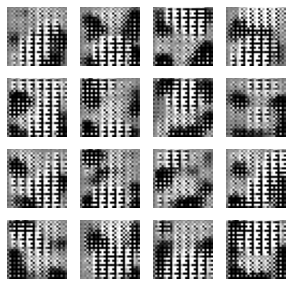

4/4 [==============================] - 0s 5ms/step
700, [D loss: 0.029829, acc.: 0.03%], [G loss: 3.191714]
1/1 [==============================] - 0s 20ms/step


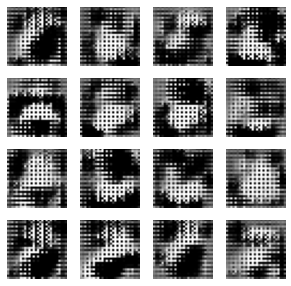

4/4 [==============================] - 0s 5ms/step
800, [D loss: 0.001142, acc.: 0.00%], [G loss: 0.104496]
1/1 [==============================] - 0s 16ms/step


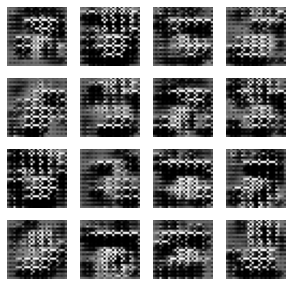

4/4 [==============================] - 0s 6ms/step
900, [D loss: 0.003146, acc.: 0.00%], [G loss: 0.495722]
1/1 [==============================] - 0s 15ms/step


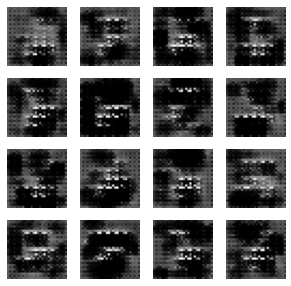

4/4 [==============================] - 0s 5ms/step
1000, [D loss: 0.154653, acc.: 0.15%], [G loss: 3.201867]
1/1 [==============================] - 0s 15ms/step


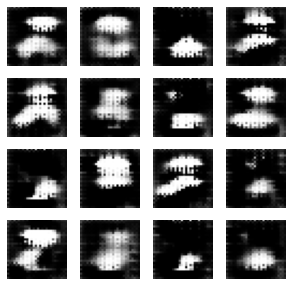

4/4 [==============================] - 0s 5ms/step
1100, [D loss: 0.052115, acc.: 0.05%], [G loss: 3.409019]
1/1 [==============================] - 0s 17ms/step


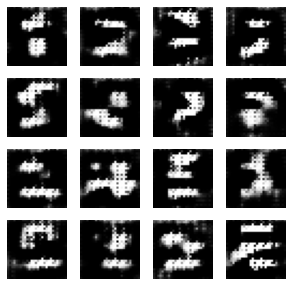

4/4 [==============================] - 0s 4ms/step
1200, [D loss: 0.019454, acc.: 0.02%], [G loss: 4.173730]
1/1 [==============================] - 0s 23ms/step


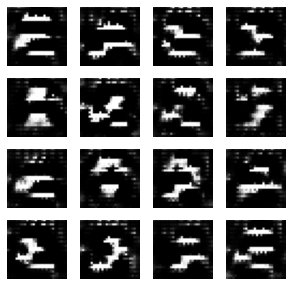

4/4 [==============================] - 0s 6ms/step
1300, [D loss: 0.097255, acc.: 0.10%], [G loss: 3.841702]
1/1 [==============================] - 0s 17ms/step


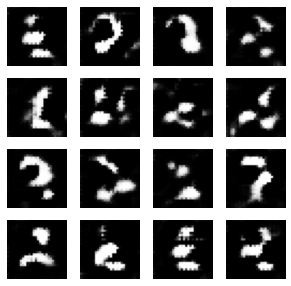

4/4 [==============================] - 0s 3ms/step
1400, [D loss: 0.346052, acc.: 0.35%], [G loss: 3.929856]
1/1 [==============================] - 0s 18ms/step


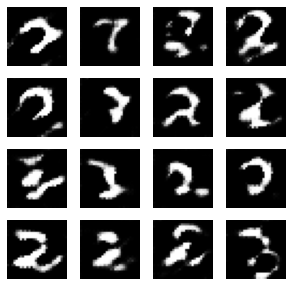

4/4 [==============================] - 0s 4ms/step
1500, [D loss: 0.070056, acc.: 0.07%], [G loss: 4.848581]
1/1 [==============================] - 0s 17ms/step


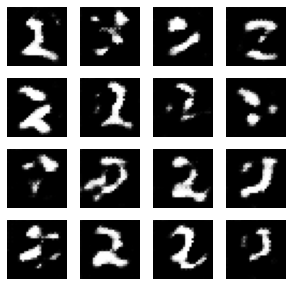

4/4 [==============================] - 0s 4ms/step
1600, [D loss: 0.257395, acc.: 0.26%], [G loss: 3.815586]
1/1 [==============================] - 0s 23ms/step


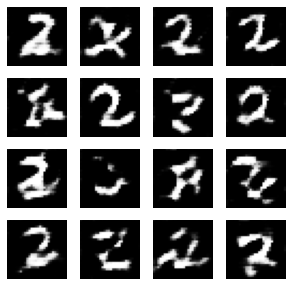

4/4 [==============================] - 0s 6ms/step
1700, [D loss: 0.220652, acc.: 0.22%], [G loss: 3.786558]
1/1 [==============================] - 0s 22ms/step


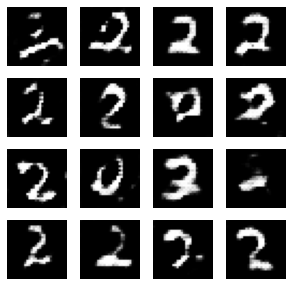

4/4 [==============================] - 0s 6ms/step
1800, [D loss: 0.238079, acc.: 0.24%], [G loss: 2.560545]
1/1 [==============================] - 0s 21ms/step


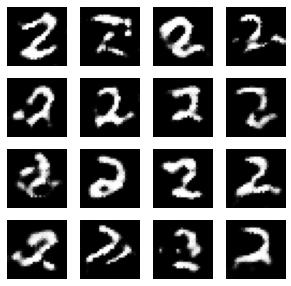

4/4 [==============================] - 0s 4ms/step
1900, [D loss: 0.126244, acc.: 0.13%], [G loss: 3.647857]
1/1 [==============================] - 0s 22ms/step


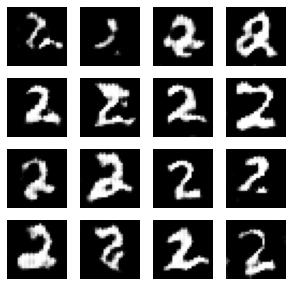

4/4 [==============================] - 0s 6ms/step
2000, [D loss: 0.143699, acc.: 0.14%], [G loss: 2.885034]
1/1 [==============================] - 0s 16ms/step


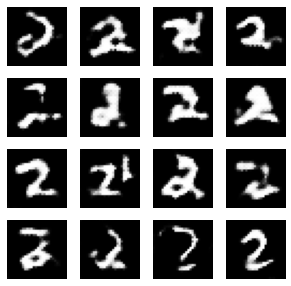

4/4 [==============================] - 0s 4ms/step
2100, [D loss: 0.339464, acc.: 0.34%], [G loss: 2.954854]
1/1 [==============================] - 0s 19ms/step


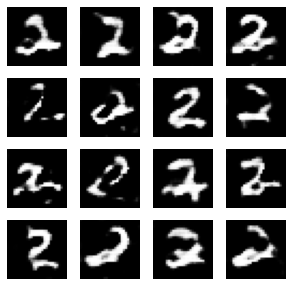

4/4 [==============================] - 0s 4ms/step
2200, [D loss: 0.171456, acc.: 0.17%], [G loss: 3.078612]
1/1 [==============================] - 0s 16ms/step


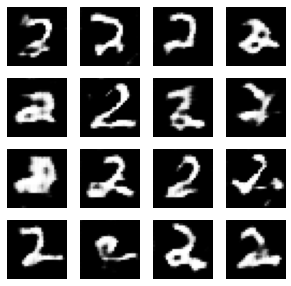

4/4 [==============================] - 0s 7ms/step
2300, [D loss: 0.372538, acc.: 0.37%], [G loss: 3.312052]
1/1 [==============================] - 0s 17ms/step


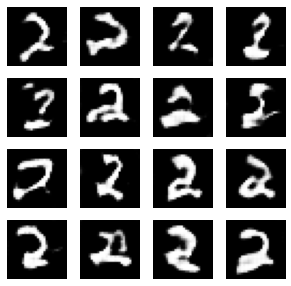

4/4 [==============================] - 0s 7ms/step
2400, [D loss: 0.300759, acc.: 0.30%], [G loss: 2.435878]
1/1 [==============================] - 0s 19ms/step


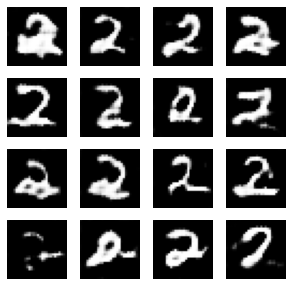

4/4 [==============================] - 0s 6ms/step
2500, [D loss: 0.426042, acc.: 0.43%], [G loss: 2.437481]
1/1 [==============================] - 0s 19ms/step


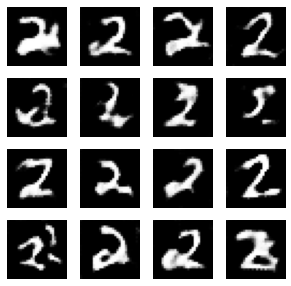

4/4 [==============================] - 0s 4ms/step
2600, [D loss: 0.418410, acc.: 0.42%], [G loss: 2.303177]
1/1 [==============================] - 0s 30ms/step


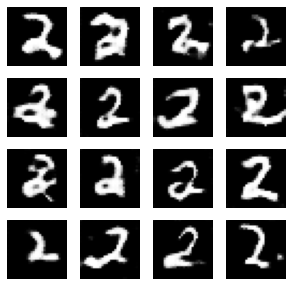

4/4 [==============================] - 0s 8ms/step
2700, [D loss: 0.388951, acc.: 0.39%], [G loss: 2.218344]
1/1 [==============================] - 0s 17ms/step


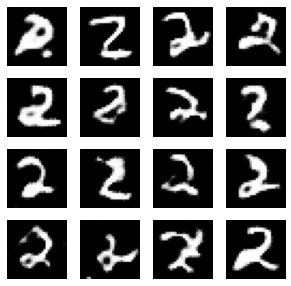

4/4 [==============================] - 0s 4ms/step
2800, [D loss: 0.426473, acc.: 0.43%], [G loss: 2.567555]
1/1 [==============================] - 0s 20ms/step


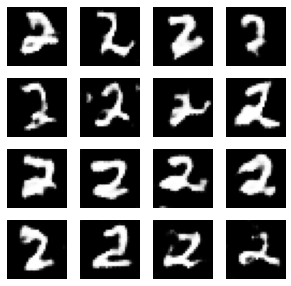

4/4 [==============================] - 0s 7ms/step
2900, [D loss: 0.209316, acc.: 0.21%], [G loss: 3.184643]
1/1 [==============================] - 0s 19ms/step


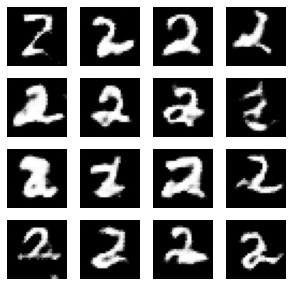

4/4 [==============================] - 0s 5ms/step
3000, [D loss: 0.534276, acc.: 0.53%], [G loss: 1.624104]
1/1 [==============================] - 0s 26ms/step


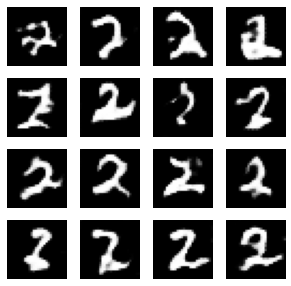

4/4 [==============================] - 0s 4ms/step
3100, [D loss: 0.141130, acc.: 0.14%], [G loss: 3.057146]
1/1 [==============================] - 0s 18ms/step


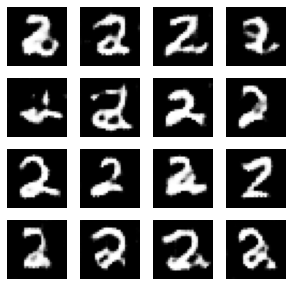

4/4 [==============================] - 0s 4ms/step
3200, [D loss: 0.247394, acc.: 0.25%], [G loss: 3.091308]
1/1 [==============================] - 0s 16ms/step


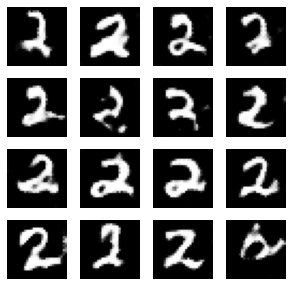

4/4 [==============================] - 0s 5ms/step
3300, [D loss: 0.228088, acc.: 0.23%], [G loss: 3.012262]
1/1 [==============================] - 0s 18ms/step


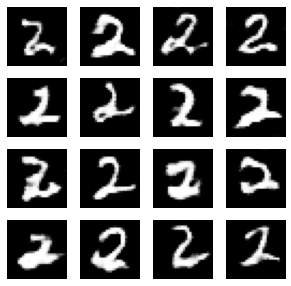

4/4 [==============================] - 0s 6ms/step
3400, [D loss: 0.209270, acc.: 0.21%], [G loss: 2.817721]
1/1 [==============================] - 0s 17ms/step


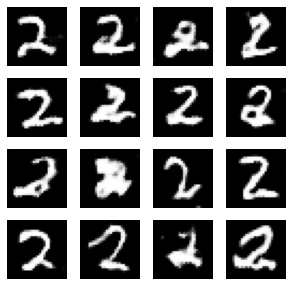

4/4 [==============================] - 0s 5ms/step
3500, [D loss: 0.189275, acc.: 0.19%], [G loss: 3.227885]
1/1 [==============================] - 0s 20ms/step


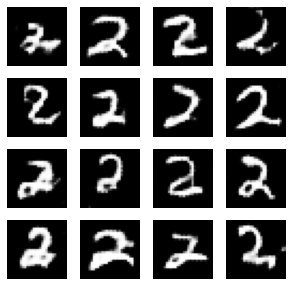

4/4 [==============================] - 0s 4ms/step
3600, [D loss: 0.094134, acc.: 0.09%], [G loss: 4.021837]
1/1 [==============================] - 0s 35ms/step


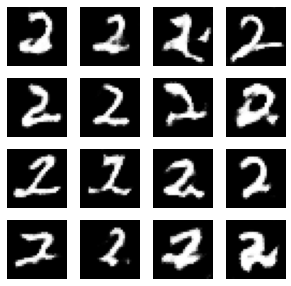

4/4 [==============================] - 0s 5ms/step
3700, [D loss: 0.228833, acc.: 0.23%], [G loss: 2.970149]
1/1 [==============================] - 0s 28ms/step


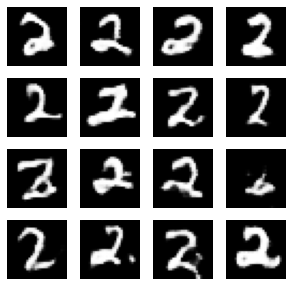

4/4 [==============================] - 0s 4ms/step
3800, [D loss: 0.136366, acc.: 0.14%], [G loss: 3.806733]
1/1 [==============================] - 0s 21ms/step


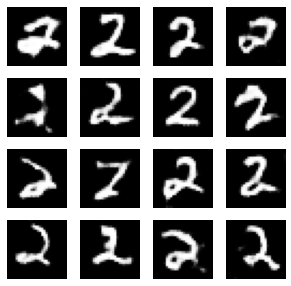

4/4 [==============================] - 0s 4ms/step
3900, [D loss: 0.363566, acc.: 0.36%], [G loss: 2.441556]
1/1 [==============================] - 0s 33ms/step


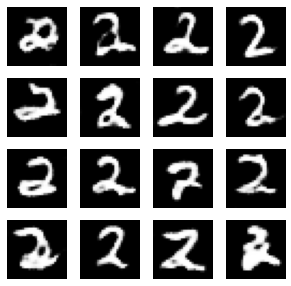

4/4 [==============================] - 0s 5ms/step
4000, [D loss: 0.308625, acc.: 0.31%], [G loss: 2.377643]
1/1 [==============================] - 0s 24ms/step


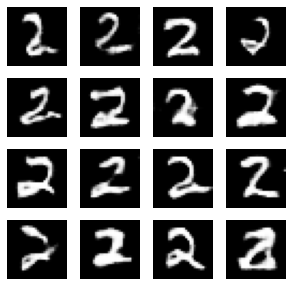

4/4 [==============================] - 0s 4ms/step
4100, [D loss: 0.350473, acc.: 0.35%], [G loss: 2.815952]
1/1 [==============================] - 0s 27ms/step


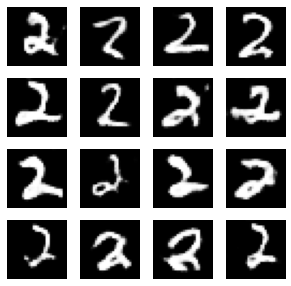

4/4 [==============================] - 0s 4ms/step
4200, [D loss: 0.336470, acc.: 0.34%], [G loss: 2.374487]
1/1 [==============================] - 0s 23ms/step


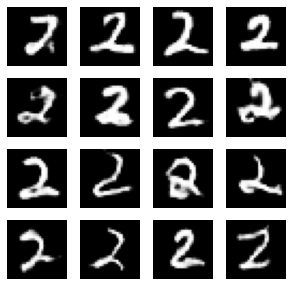

4/4 [==============================] - 0s 5ms/step
4300, [D loss: 0.299082, acc.: 0.30%], [G loss: 3.291547]
1/1 [==============================] - 0s 24ms/step


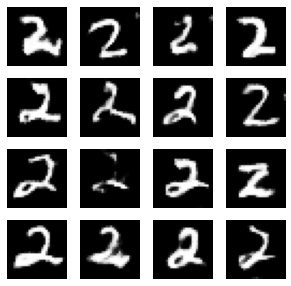

4/4 [==============================] - 0s 6ms/step
4400, [D loss: 0.271231, acc.: 0.27%], [G loss: 2.310449]
1/1 [==============================] - 0s 16ms/step


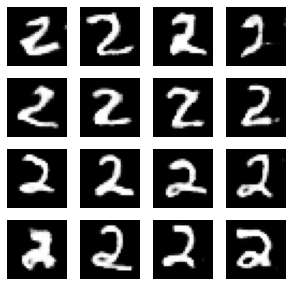

4/4 [==============================] - 0s 4ms/step
4500, [D loss: 0.257163, acc.: 0.26%], [G loss: 2.778166]
1/1 [==============================] - 0s 23ms/step


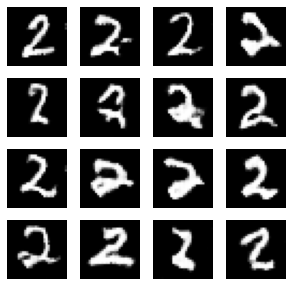

4/4 [==============================] - 0s 5ms/step
4600, [D loss: 0.205509, acc.: 0.21%], [G loss: 3.058868]
1/1 [==============================] - 0s 25ms/step


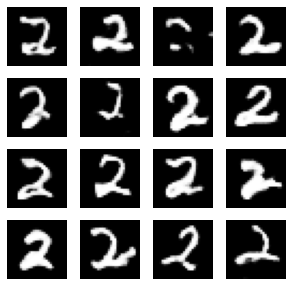

4/4 [==============================] - 0s 6ms/step
4700, [D loss: 0.335870, acc.: 0.34%], [G loss: 2.464822]
1/1 [==============================] - 0s 26ms/step


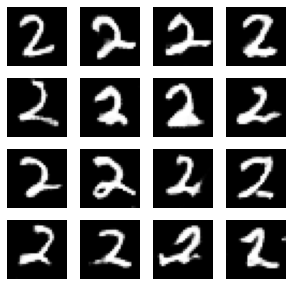

4/4 [==============================] - 0s 4ms/step
4800, [D loss: 0.324907, acc.: 0.32%], [G loss: 3.295007]
1/1 [==============================] - 0s 22ms/step


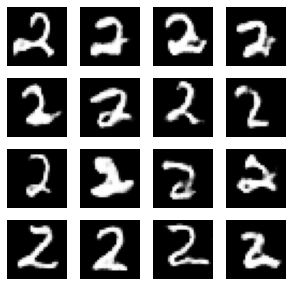

4/4 [==============================] - 0s 4ms/step
4900, [D loss: 0.400537, acc.: 0.40%], [G loss: 2.999131]
1/1 [==============================] - 0s 25ms/step


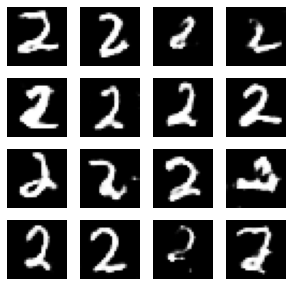

4/4 [==============================] - 0s 6ms/step
5000, [D loss: 0.327941, acc.: 0.33%], [G loss: 1.905665]
1/1 [==============================] - 0s 20ms/step


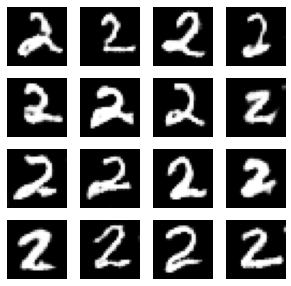

4/4 [==============================] - 0s 3ms/step
5100, [D loss: 0.322468, acc.: 0.32%], [G loss: 2.898088]
1/1 [==============================] - 0s 20ms/step


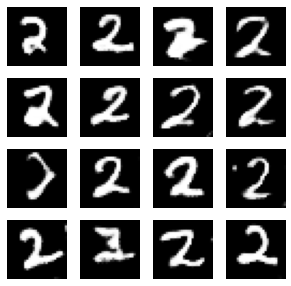

4/4 [==============================] - 0s 5ms/step
5200, [D loss: 0.174237, acc.: 0.17%], [G loss: 3.133799]
1/1 [==============================] - 0s 18ms/step


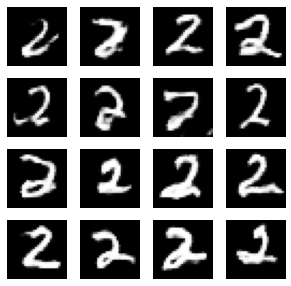

4/4 [==============================] - 0s 5ms/step
5300, [D loss: 0.209776, acc.: 0.21%], [G loss: 2.694228]
1/1 [==============================] - 0s 26ms/step


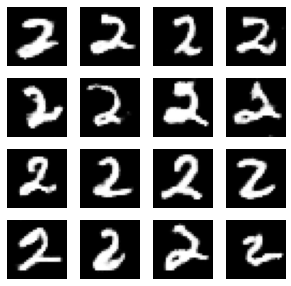

4/4 [==============================] - 0s 4ms/step
5400, [D loss: 0.299008, acc.: 0.30%], [G loss: 2.663273]
1/1 [==============================] - 0s 21ms/step


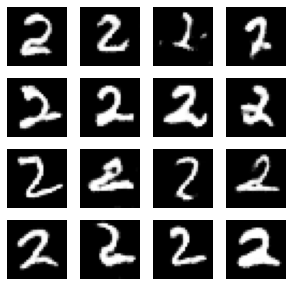

4/4 [==============================] - 0s 5ms/step
5500, [D loss: 0.308898, acc.: 0.31%], [G loss: 2.848114]
1/1 [==============================] - 0s 19ms/step


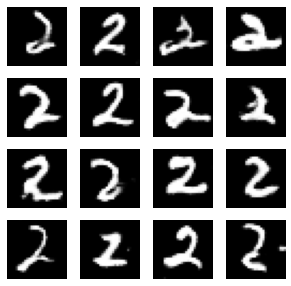

4/4 [==============================] - 0s 3ms/step
5600, [D loss: 0.405158, acc.: 0.41%], [G loss: 2.682429]
1/1 [==============================] - 0s 23ms/step


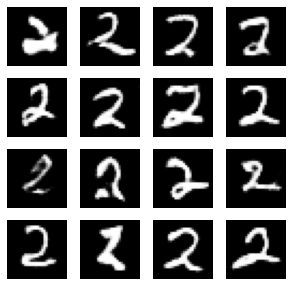

4/4 [==============================] - 0s 4ms/step
5700, [D loss: 0.262963, acc.: 0.26%], [G loss: 2.845339]
1/1 [==============================] - 0s 21ms/step


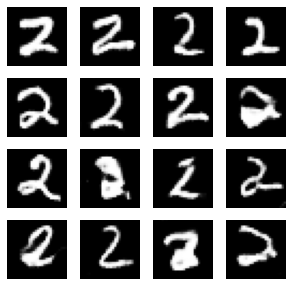

4/4 [==============================] - 0s 4ms/step
5800, [D loss: 0.219871, acc.: 0.22%], [G loss: 3.389792]
1/1 [==============================] - 0s 15ms/step


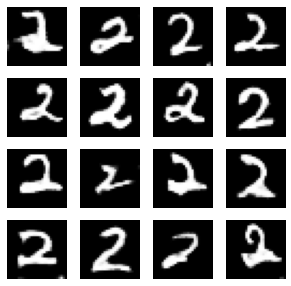

4/4 [==============================] - 0s 4ms/step
5900, [D loss: 0.341207, acc.: 0.34%], [G loss: 2.548005]
1/1 [==============================] - 0s 20ms/step


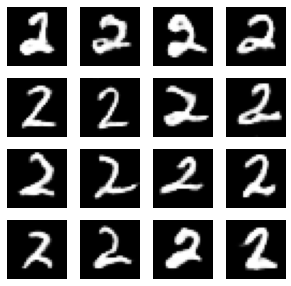

4/4 [==============================] - 0s 4ms/step
6000, [D loss: 0.228158, acc.: 0.23%], [G loss: 3.129361]
1/1 [==============================] - 0s 33ms/step


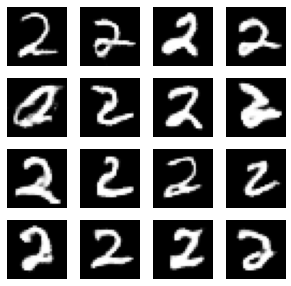

4/4 [==============================] - 0s 4ms/step
6100, [D loss: 0.322611, acc.: 0.32%], [G loss: 2.973912]
1/1 [==============================] - 0s 26ms/step


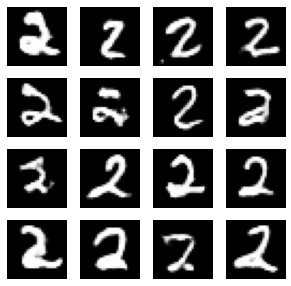

4/4 [==============================] - 0s 4ms/step
6200, [D loss: 0.430915, acc.: 0.43%], [G loss: 2.371176]
1/1 [==============================] - 0s 27ms/step


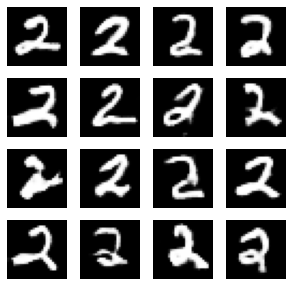

4/4 [==============================] - 0s 4ms/step
6300, [D loss: 0.323045, acc.: 0.32%], [G loss: 3.013553]
1/1 [==============================] - 0s 17ms/step


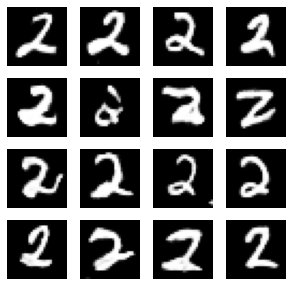

4/4 [==============================] - 0s 6ms/step
6400, [D loss: 0.354055, acc.: 0.35%], [G loss: 2.056875]
1/1 [==============================] - 0s 21ms/step


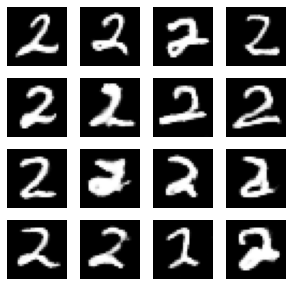

4/4 [==============================] - 0s 5ms/step
6500, [D loss: 0.211878, acc.: 0.21%], [G loss: 3.058860]
1/1 [==============================] - 0s 18ms/step


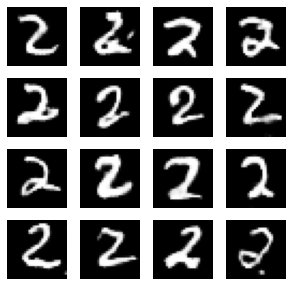

4/4 [==============================] - 0s 8ms/step
6600, [D loss: 0.286730, acc.: 0.29%], [G loss: 2.308805]
1/1 [==============================] - 0s 55ms/step


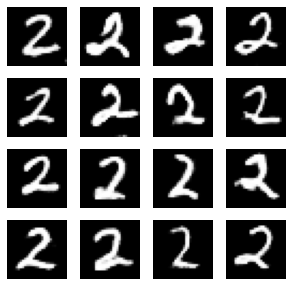

4/4 [==============================] - 0s 5ms/step
6700, [D loss: 0.322861, acc.: 0.32%], [G loss: 2.515006]
1/1 [==============================] - 0s 15ms/step


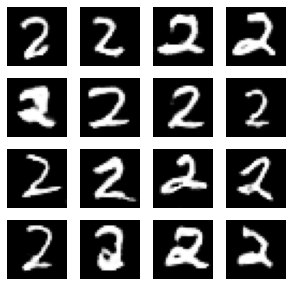

4/4 [==============================] - 0s 5ms/step
6800, [D loss: 0.394371, acc.: 0.39%], [G loss: 2.404666]
1/1 [==============================] - 0s 23ms/step


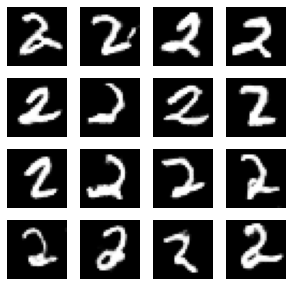

4/4 [==============================] - 0s 4ms/step
6900, [D loss: 0.254469, acc.: 0.25%], [G loss: 3.077882]
1/1 [==============================] - 0s 23ms/step


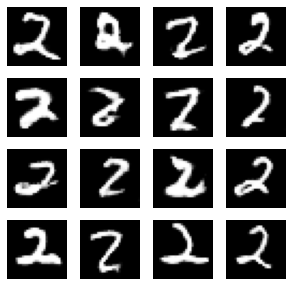

4/4 [==============================] - 0s 5ms/step
7000, [D loss: 0.199208, acc.: 0.20%], [G loss: 3.057922]
1/1 [==============================] - 0s 17ms/step


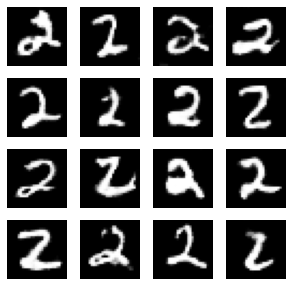

4/4 [==============================] - 0s 5ms/step
7100, [D loss: 0.254033, acc.: 0.25%], [G loss: 3.288602]
1/1 [==============================] - 0s 21ms/step


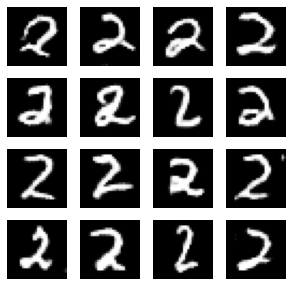

4/4 [==============================] - 0s 5ms/step
7200, [D loss: 0.298984, acc.: 0.30%], [G loss: 2.949608]
1/1 [==============================] - 0s 16ms/step


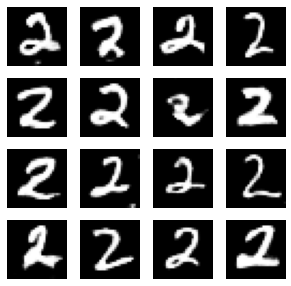

4/4 [==============================] - 0s 4ms/step
7300, [D loss: 0.258549, acc.: 0.26%], [G loss: 3.284496]
1/1 [==============================] - 0s 17ms/step


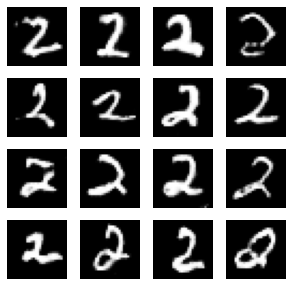

4/4 [==============================] - 0s 5ms/step
7400, [D loss: 0.176744, acc.: 0.18%], [G loss: 2.847832]
1/1 [==============================] - 0s 22ms/step


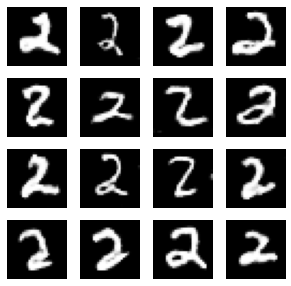

4/4 [==============================] - 0s 5ms/step
7500, [D loss: 0.297323, acc.: 0.30%], [G loss: 3.104195]
1/1 [==============================] - 0s 24ms/step


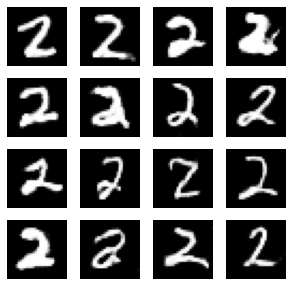

4/4 [==============================] - 0s 4ms/step
7600, [D loss: 0.277655, acc.: 0.28%], [G loss: 2.812306]
1/1 [==============================] - 0s 15ms/step


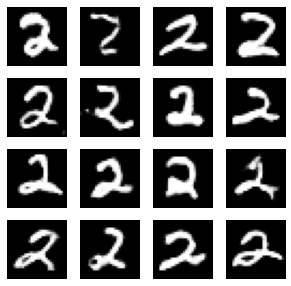

4/4 [==============================] - 0s 4ms/step
7700, [D loss: 0.232454, acc.: 0.23%], [G loss: 2.834130]
1/1 [==============================] - 0s 21ms/step


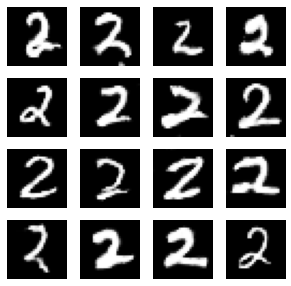

4/4 [==============================] - 0s 4ms/step
7800, [D loss: 0.285331, acc.: 0.29%], [G loss: 3.078306]
1/1 [==============================] - 0s 26ms/step


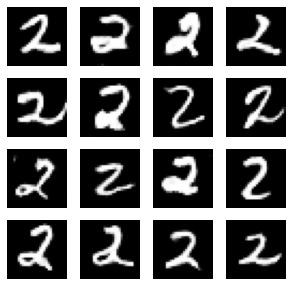

4/4 [==============================] - 0s 5ms/step
7900, [D loss: 0.390763, acc.: 0.39%], [G loss: 2.563665]
1/1 [==============================] - 0s 25ms/step


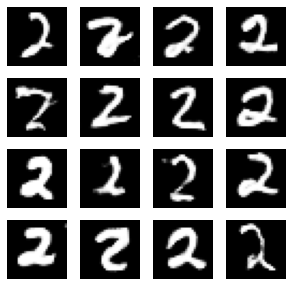

4/4 [==============================] - 0s 5ms/step
8000, [D loss: 0.286887, acc.: 0.29%], [G loss: 3.437969]
1/1 [==============================] - 0s 22ms/step


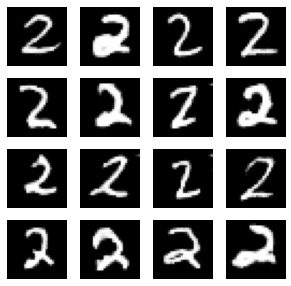

4/4 [==============================] - 0s 4ms/step
8100, [D loss: 0.229112, acc.: 0.23%], [G loss: 3.734558]
1/1 [==============================] - 0s 23ms/step


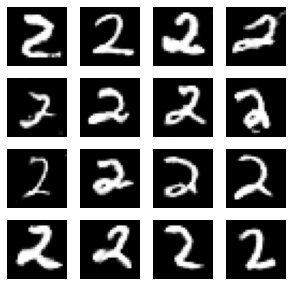

4/4 [==============================] - 0s 5ms/step
8200, [D loss: 0.262435, acc.: 0.26%], [G loss: 2.875445]
1/1 [==============================] - 0s 18ms/step


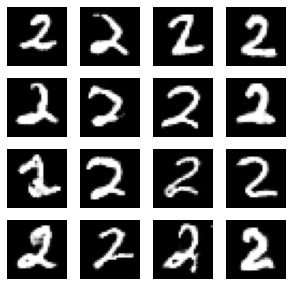

4/4 [==============================] - 0s 5ms/step
8300, [D loss: 0.188351, acc.: 0.19%], [G loss: 3.489169]
1/1 [==============================] - 0s 16ms/step


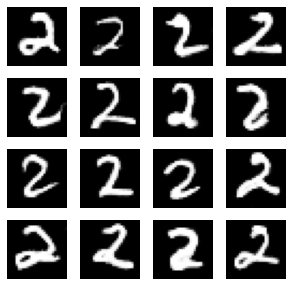

4/4 [==============================] - 0s 4ms/step
8400, [D loss: 0.316868, acc.: 0.32%], [G loss: 2.594893]
1/1 [==============================] - 0s 28ms/step


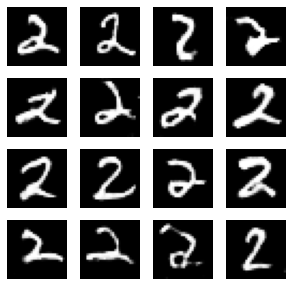

4/4 [==============================] - 0s 5ms/step
8500, [D loss: 0.237436, acc.: 0.24%], [G loss: 3.211404]
1/1 [==============================] - 0s 23ms/step


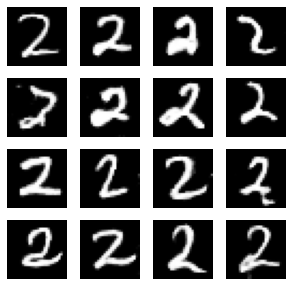

4/4 [==============================] - 0s 4ms/step
8600, [D loss: 0.332481, acc.: 0.33%], [G loss: 3.157572]
1/1 [==============================] - 0s 23ms/step


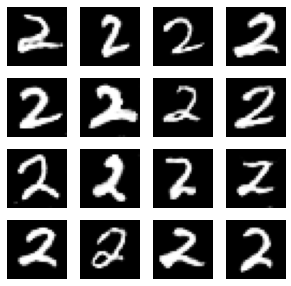

4/4 [==============================] - 0s 4ms/step
8700, [D loss: 0.299992, acc.: 0.30%], [G loss: 3.111158]
1/1 [==============================] - 0s 22ms/step


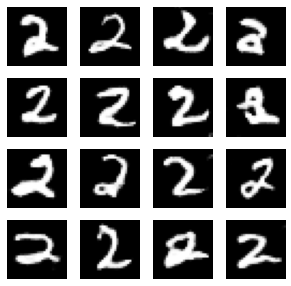

4/4 [==============================] - 0s 4ms/step
8800, [D loss: 0.147244, acc.: 0.15%], [G loss: 3.422398]
1/1 [==============================] - 0s 25ms/step


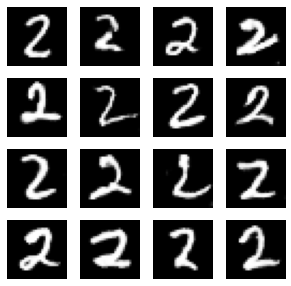

4/4 [==============================] - 0s 4ms/step
8900, [D loss: 0.312520, acc.: 0.31%], [G loss: 3.032456]
1/1 [==============================] - 0s 22ms/step


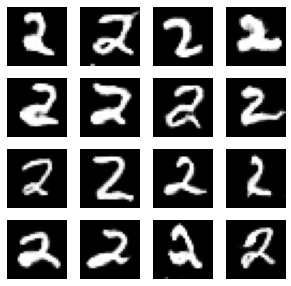

4/4 [==============================] - 0s 5ms/step
9000, [D loss: 0.212986, acc.: 0.21%], [G loss: 3.850670]
1/1 [==============================] - 0s 24ms/step


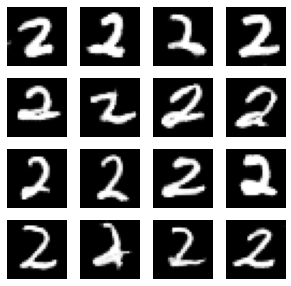

4/4 [==============================] - 0s 4ms/step
9100, [D loss: 0.295228, acc.: 0.30%], [G loss: 2.953452]
1/1 [==============================] - 0s 23ms/step


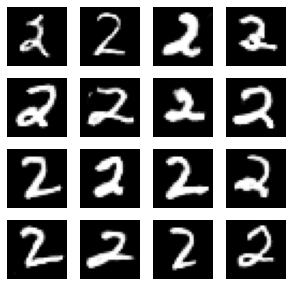

4/4 [==============================] - 0s 4ms/step
9200, [D loss: 0.162835, acc.: 0.16%], [G loss: 3.885766]
1/1 [==============================] - 0s 22ms/step


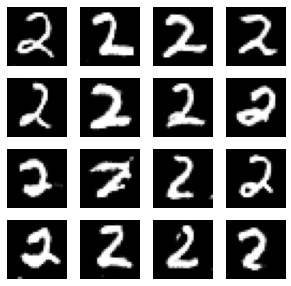

4/4 [==============================] - 0s 4ms/step
9300, [D loss: 0.315439, acc.: 0.32%], [G loss: 3.861116]
1/1 [==============================] - 0s 30ms/step


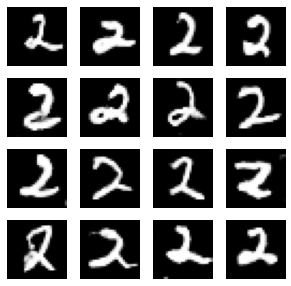

4/4 [==============================] - 0s 4ms/step
9400, [D loss: 0.167113, acc.: 0.17%], [G loss: 3.875648]
1/1 [==============================] - 0s 24ms/step


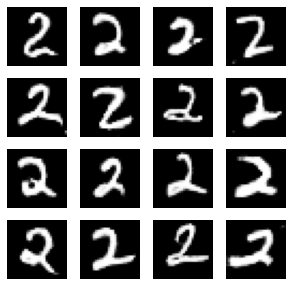

4/4 [==============================] - 0s 4ms/step
9500, [D loss: 0.430980, acc.: 0.43%], [G loss: 2.876998]
1/1 [==============================] - 0s 22ms/step


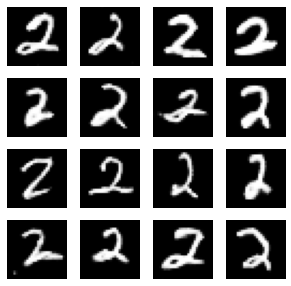

4/4 [==============================] - 0s 4ms/step
9600, [D loss: 0.261904, acc.: 0.26%], [G loss: 2.839011]
1/1 [==============================] - 0s 21ms/step


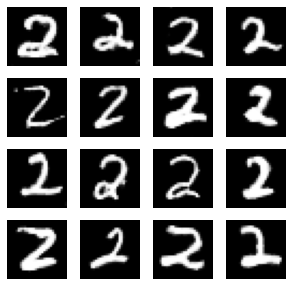

4/4 [==============================] - 0s 4ms/step
9700, [D loss: 0.182533, acc.: 0.18%], [G loss: 2.998643]
1/1 [==============================] - 0s 22ms/step


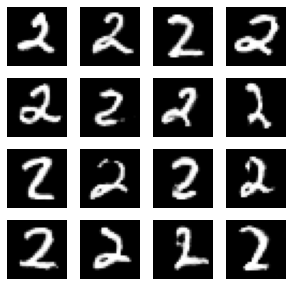

4/4 [==============================] - 0s 3ms/step
9800, [D loss: 0.252888, acc.: 0.25%], [G loss: 3.325501]
1/1 [==============================] - 0s 26ms/step


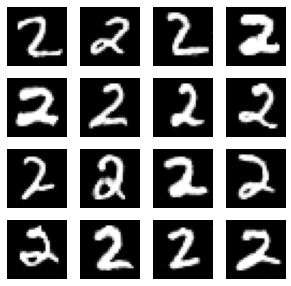

4/4 [==============================] - 0s 3ms/step
9900, [D loss: 0.182511, acc.: 0.18%], [G loss: 3.080041]
1/1 [==============================] - 0s 24ms/step


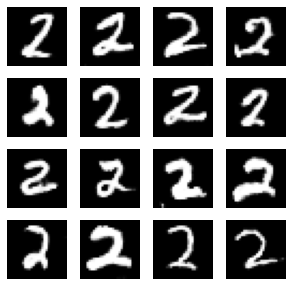

4/4 [==============================] - 0s 4ms/step
10000, [D loss: 0.242138, acc.: 0.24%], [G loss: 2.613002]
1/1 [==============================] - 0s 21ms/step


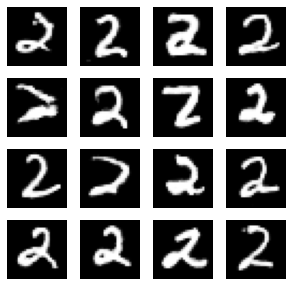

4/4 [==============================] - 0s 4ms/step
10100, [D loss: 0.276928, acc.: 0.28%], [G loss: 3.303191]
1/1 [==============================] - 0s 23ms/step


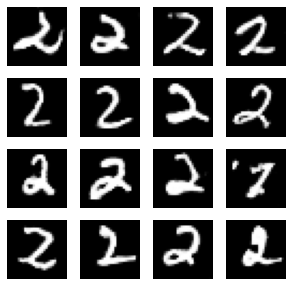

4/4 [==============================] - 0s 4ms/step
10200, [D loss: 0.217015, acc.: 0.22%], [G loss: 3.263448]
1/1 [==============================] - 0s 21ms/step


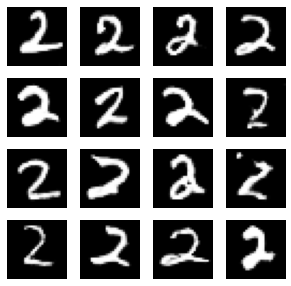

4/4 [==============================] - 0s 4ms/step
10300, [D loss: 0.238523, acc.: 0.24%], [G loss: 3.524278]
1/1 [==============================] - 0s 23ms/step


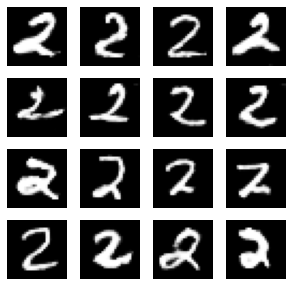

4/4 [==============================] - 0s 4ms/step
10400, [D loss: 0.266229, acc.: 0.27%], [G loss: 3.184808]
1/1 [==============================] - 0s 22ms/step


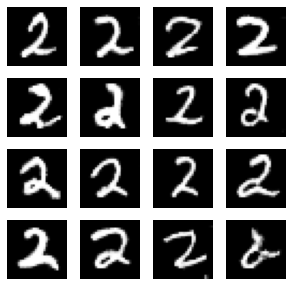

4/4 [==============================] - 0s 4ms/step
10500, [D loss: 0.272778, acc.: 0.27%], [G loss: 2.691417]
1/1 [==============================] - 0s 21ms/step


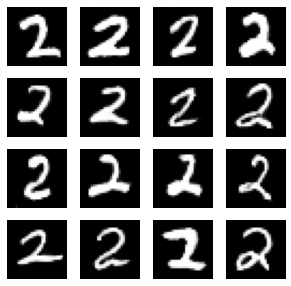

4/4 [==============================] - 0s 4ms/step
10600, [D loss: 0.238640, acc.: 0.24%], [G loss: 3.724451]
1/1 [==============================] - 0s 33ms/step


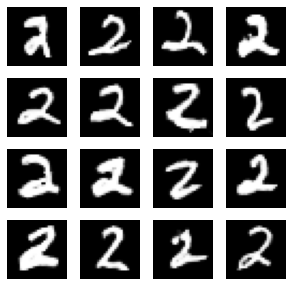

4/4 [==============================] - 0s 4ms/step
10700, [D loss: 0.189115, acc.: 0.19%], [G loss: 3.269842]
1/1 [==============================] - 0s 23ms/step


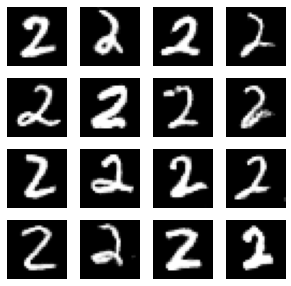

4/4 [==============================] - 0s 3ms/step
10800, [D loss: 0.299683, acc.: 0.30%], [G loss: 2.789121]
1/1 [==============================] - 0s 22ms/step


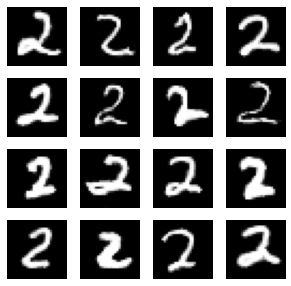

4/4 [==============================] - 0s 4ms/step
10900, [D loss: 0.201134, acc.: 0.20%], [G loss: 3.093228]
1/1 [==============================] - 0s 22ms/step


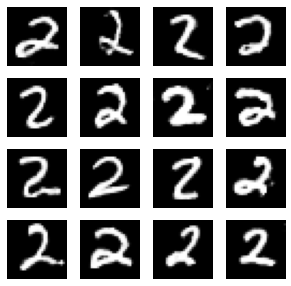

4/4 [==============================] - 0s 5ms/step
11000, [D loss: 0.166390, acc.: 0.17%], [G loss: 3.811248]
1/1 [==============================] - 0s 22ms/step


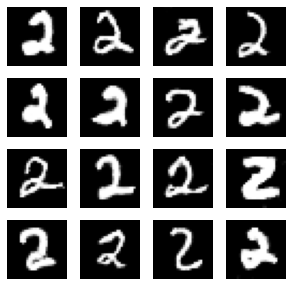

4/4 [==============================] - 0s 4ms/step
11100, [D loss: 0.230667, acc.: 0.23%], [G loss: 3.923715]
1/1 [==============================] - 0s 24ms/step


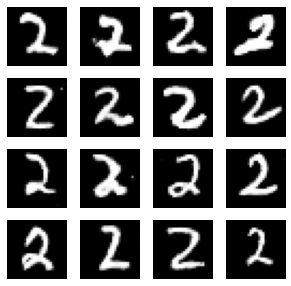

4/4 [==============================] - 0s 4ms/step
11200, [D loss: 0.247969, acc.: 0.25%], [G loss: 3.629751]
1/1 [==============================] - 0s 22ms/step


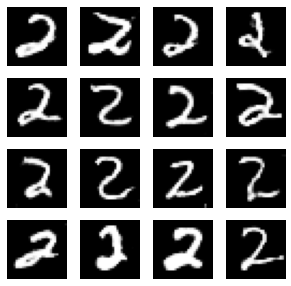

4/4 [==============================] - 0s 4ms/step
11300, [D loss: 0.294079, acc.: 0.29%], [G loss: 3.254738]
1/1 [==============================] - 0s 24ms/step


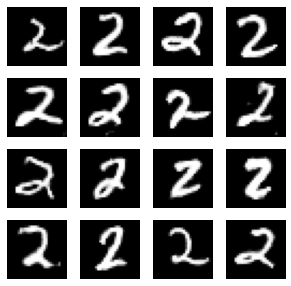

4/4 [==============================] - 0s 4ms/step
11400, [D loss: 0.261483, acc.: 0.26%], [G loss: 4.113536]
1/1 [==============================] - 0s 26ms/step


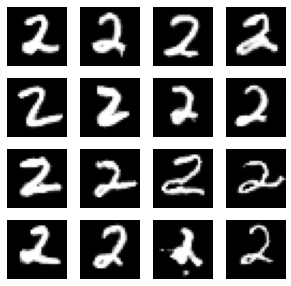

4/4 [==============================] - 0s 4ms/step
11500, [D loss: 0.187277, acc.: 0.19%], [G loss: 3.965927]
1/1 [==============================] - 0s 28ms/step


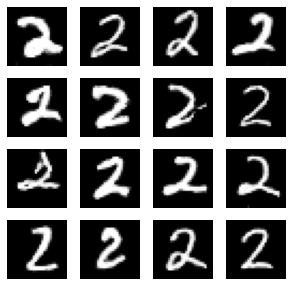

4/4 [==============================] - 0s 5ms/step
11600, [D loss: 0.257384, acc.: 0.26%], [G loss: 3.288439]
1/1 [==============================] - 0s 21ms/step


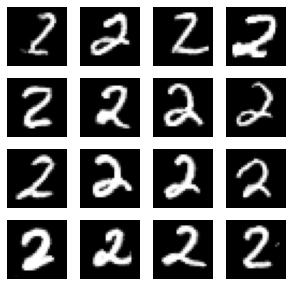

4/4 [==============================] - 0s 3ms/step
11700, [D loss: 0.215522, acc.: 0.22%], [G loss: 3.559642]
1/1 [==============================] - 0s 22ms/step


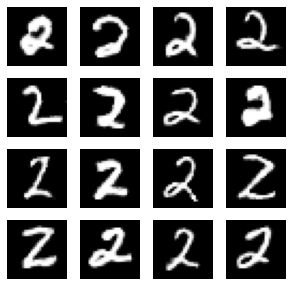

4/4 [==============================] - 0s 4ms/step
11800, [D loss: 0.235533, acc.: 0.24%], [G loss: 3.604187]
1/1 [==============================] - 0s 27ms/step


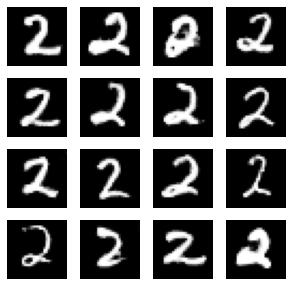

4/4 [==============================] - 0s 5ms/step
11900, [D loss: 0.301673, acc.: 0.30%], [G loss: 3.375628]
1/1 [==============================] - 0s 21ms/step


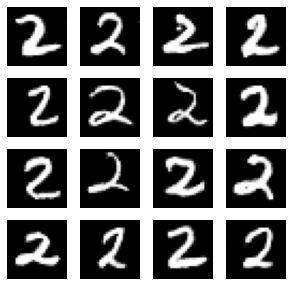

4/4 [==============================] - 0s 4ms/step
12000, [D loss: 0.208944, acc.: 0.21%], [G loss: 3.462304]
1/1 [==============================] - 0s 20ms/step


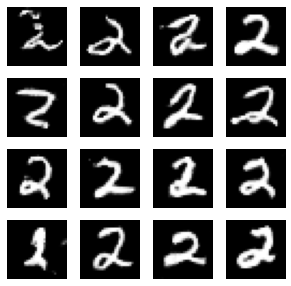

4/4 [==============================] - 0s 4ms/step
12100, [D loss: 0.251054, acc.: 0.25%], [G loss: 3.117350]
1/1 [==============================] - 0s 23ms/step


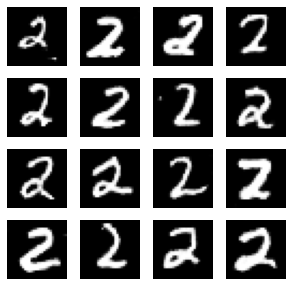

4/4 [==============================] - 0s 4ms/step
12200, [D loss: 0.239109, acc.: 0.24%], [G loss: 3.064573]
1/1 [==============================] - 0s 24ms/step


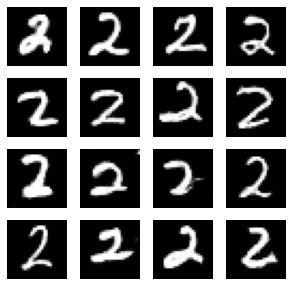

4/4 [==============================] - 0s 5ms/step
12300, [D loss: 0.193700, acc.: 0.19%], [G loss: 3.018542]
1/1 [==============================] - 0s 22ms/step


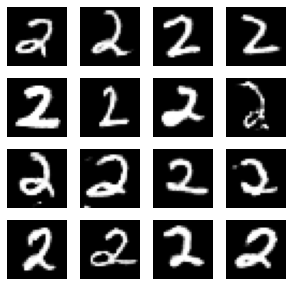

4/4 [==============================] - 0s 3ms/step
12400, [D loss: 0.228184, acc.: 0.23%], [G loss: 3.305297]
1/1 [==============================] - 0s 20ms/step


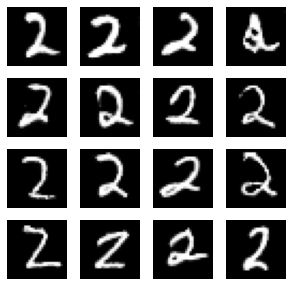

4/4 [==============================] - 0s 3ms/step
12500, [D loss: 0.240116, acc.: 0.24%], [G loss: 3.597488]
1/1 [==============================] - 0s 31ms/step


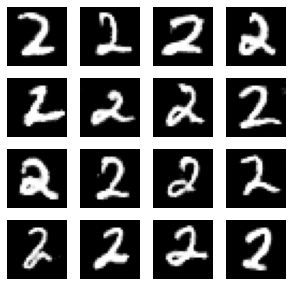

4/4 [==============================] - 0s 4ms/step
12600, [D loss: 0.219424, acc.: 0.22%], [G loss: 3.338196]
1/1 [==============================] - 0s 21ms/step


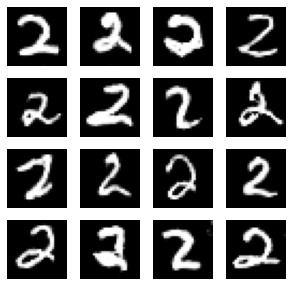

4/4 [==============================] - 0s 3ms/step
12700, [D loss: 0.218127, acc.: 0.22%], [G loss: 3.625473]
1/1 [==============================] - 0s 20ms/step


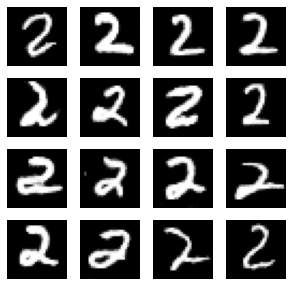

4/4 [==============================] - 0s 4ms/step
12800, [D loss: 0.217056, acc.: 0.22%], [G loss: 3.229060]
1/1 [==============================] - 0s 22ms/step


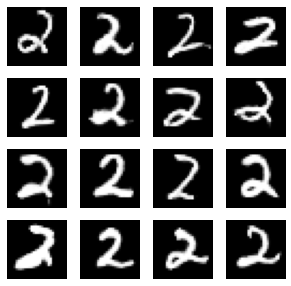

4/4 [==============================] - 0s 4ms/step
12900, [D loss: 0.170928, acc.: 0.17%], [G loss: 4.106800]
1/1 [==============================] - 0s 21ms/step


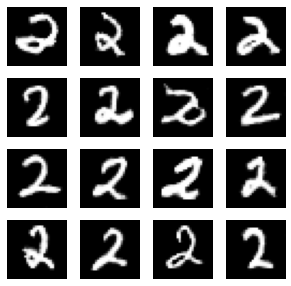

4/4 [==============================] - 0s 5ms/step
13000, [D loss: 0.174088, acc.: 0.17%], [G loss: 3.622679]
1/1 [==============================] - 0s 27ms/step


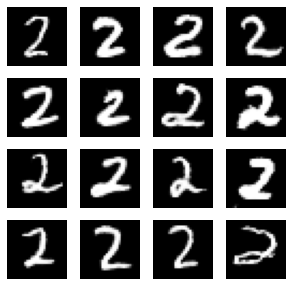

4/4 [==============================] - 0s 3ms/step
13100, [D loss: 0.156435, acc.: 0.16%], [G loss: 4.120767]
1/1 [==============================] - 0s 21ms/step


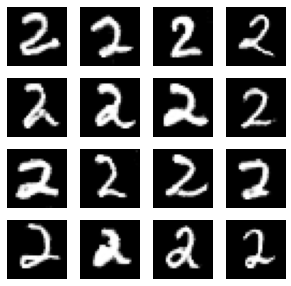

4/4 [==============================] - 0s 4ms/step
13200, [D loss: 0.130922, acc.: 0.13%], [G loss: 3.891477]
1/1 [==============================] - 0s 19ms/step


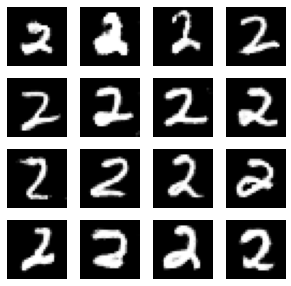

4/4 [==============================] - 0s 4ms/step
13300, [D loss: 0.207100, acc.: 0.21%], [G loss: 3.402998]
1/1 [==============================] - 0s 20ms/step


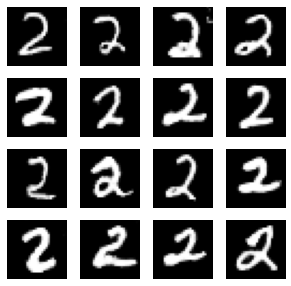

4/4 [==============================] - 0s 5ms/step
13400, [D loss: 0.229579, acc.: 0.23%], [G loss: 2.591425]
1/1 [==============================] - 0s 19ms/step


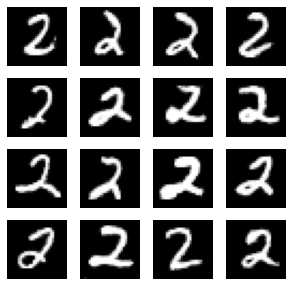

4/4 [==============================] - 0s 5ms/step
13500, [D loss: 0.287940, acc.: 0.29%], [G loss: 2.880950]
1/1 [==============================] - 0s 21ms/step


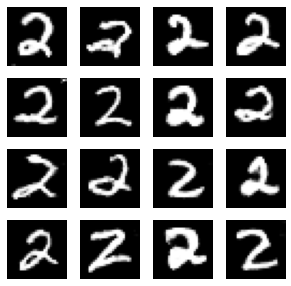

4/4 [==============================] - 0s 4ms/step
13600, [D loss: 0.241138, acc.: 0.24%], [G loss: 3.948652]
1/1 [==============================] - 0s 22ms/step


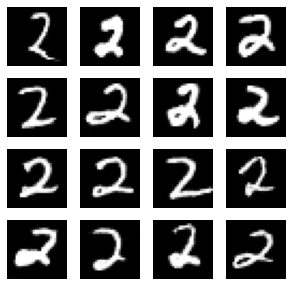

4/4 [==============================] - 0s 4ms/step
13700, [D loss: 0.276335, acc.: 0.28%], [G loss: 3.367462]
1/1 [==============================] - 0s 24ms/step


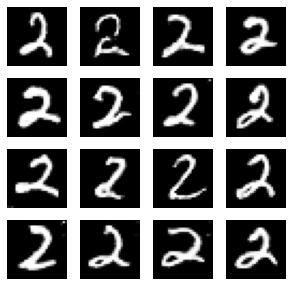

4/4 [==============================] - 0s 5ms/step
13800, [D loss: 0.218137, acc.: 0.22%], [G loss: 3.621719]
1/1 [==============================] - 0s 19ms/step


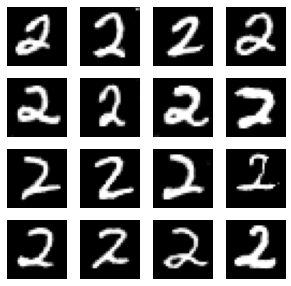

4/4 [==============================] - 0s 4ms/step
13900, [D loss: 0.186380, acc.: 0.19%], [G loss: 3.487585]
1/1 [==============================] - 0s 22ms/step


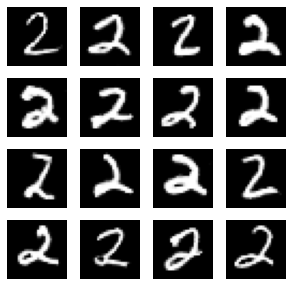

4/4 [==============================] - 0s 4ms/step
14000, [D loss: 0.258059, acc.: 0.26%], [G loss: 3.880228]
1/1 [==============================] - 0s 22ms/step


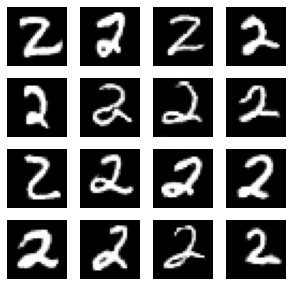

4/4 [==============================] - 0s 3ms/step
14100, [D loss: 0.237591, acc.: 0.24%], [G loss: 3.084103]
1/1 [==============================] - 0s 22ms/step


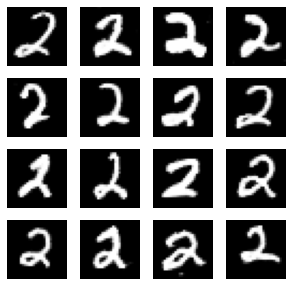

4/4 [==============================] - 0s 4ms/step
14200, [D loss: 0.268831, acc.: 0.27%], [G loss: 3.804818]
1/1 [==============================] - 0s 21ms/step


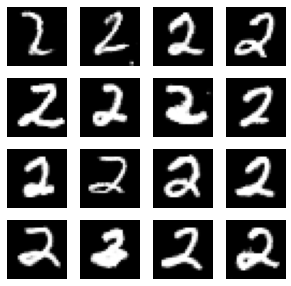

4/4 [==============================] - 0s 6ms/step
14300, [D loss: 0.206829, acc.: 0.21%], [G loss: 4.063988]
1/1 [==============================] - 0s 19ms/step


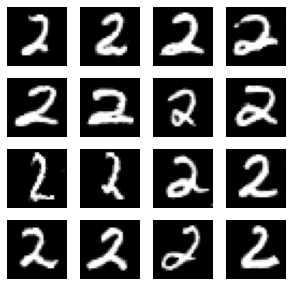

4/4 [==============================] - 0s 4ms/step
14400, [D loss: 0.226484, acc.: 0.23%], [G loss: 4.190164]
1/1 [==============================] - 0s 26ms/step


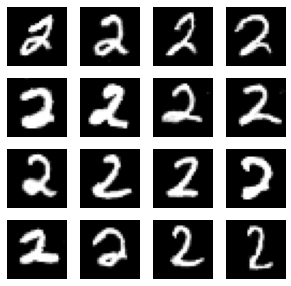

4/4 [==============================] - 0s 4ms/step
14500, [D loss: 0.252273, acc.: 0.25%], [G loss: 4.006992]
1/1 [==============================] - 0s 22ms/step


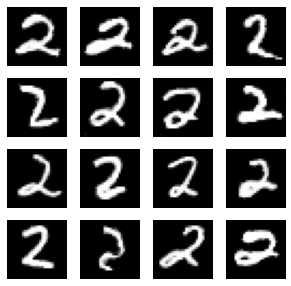

4/4 [==============================] - 0s 4ms/step
14600, [D loss: 0.246643, acc.: 0.25%], [G loss: 4.647767]
1/1 [==============================] - 0s 22ms/step


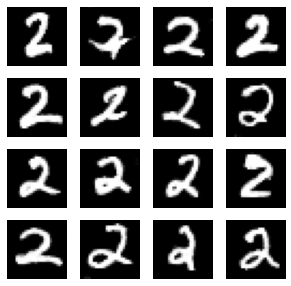

4/4 [==============================] - 0s 6ms/step
14700, [D loss: 0.278863, acc.: 0.28%], [G loss: 3.532458]
1/1 [==============================] - 0s 46ms/step


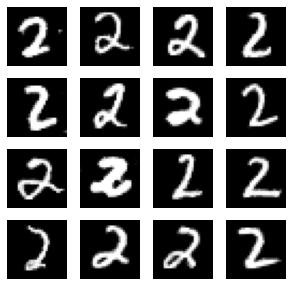

4/4 [==============================] - 0s 3ms/step
14800, [D loss: 0.290465, acc.: 0.29%], [G loss: 3.488083]
1/1 [==============================] - 0s 22ms/step


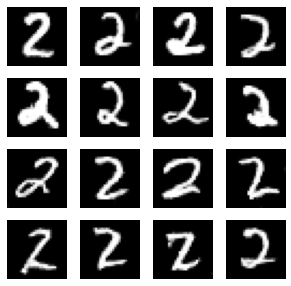

4/4 [==============================] - 0s 4ms/step
14900, [D loss: 0.184846, acc.: 0.18%], [G loss: 3.797311]
1/1 [==============================] - 0s 22ms/step


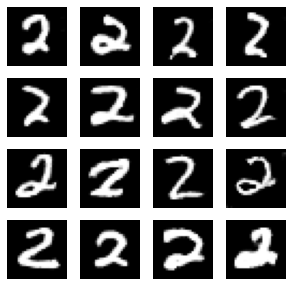

4/4 [==============================] - 0s 5ms/step
15000, [D loss: 0.280153, acc.: 0.28%], [G loss: 3.822151]
1/1 [==============================] - 0s 22ms/step


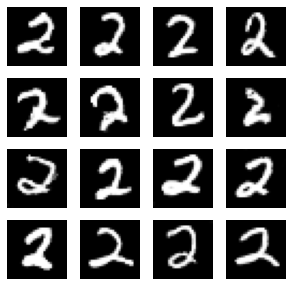

4/4 [==============================] - 0s 5ms/step
15100, [D loss: 0.175602, acc.: 0.18%], [G loss: 4.051842]
1/1 [==============================] - 0s 22ms/step


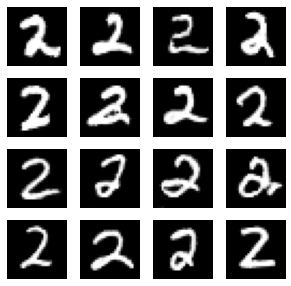

4/4 [==============================] - 0s 5ms/step
15200, [D loss: 0.218109, acc.: 0.22%], [G loss: 3.944235]
1/1 [==============================] - 0s 21ms/step


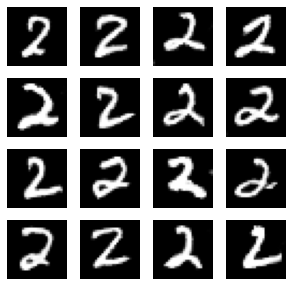

4/4 [==============================] - 0s 4ms/step
15300, [D loss: 0.188764, acc.: 0.19%], [G loss: 3.748289]
1/1 [==============================] - 0s 31ms/step


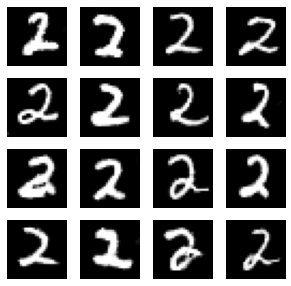

4/4 [==============================] - 0s 5ms/step
15400, [D loss: 0.226310, acc.: 0.23%], [G loss: 3.407374]
1/1 [==============================] - 0s 37ms/step


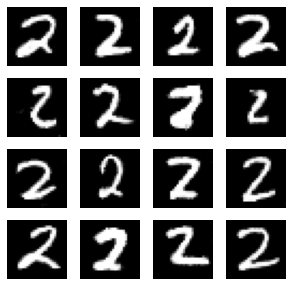

4/4 [==============================] - 0s 4ms/step
15500, [D loss: 0.257620, acc.: 0.26%], [G loss: 2.977795]
1/1 [==============================] - 0s 25ms/step


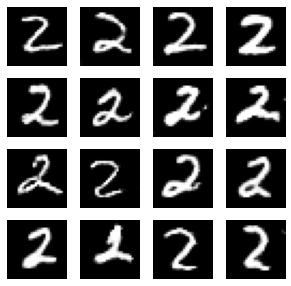

4/4 [==============================] - 0s 4ms/step
15600, [D loss: 0.132807, acc.: 0.13%], [G loss: 4.836442]
1/1 [==============================] - 0s 31ms/step


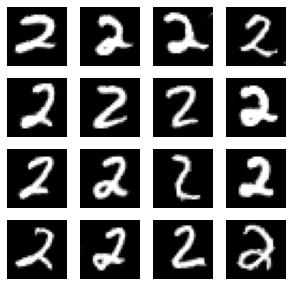

4/4 [==============================] - 0s 3ms/step
15700, [D loss: 0.192386, acc.: 0.19%], [G loss: 3.379047]
1/1 [==============================] - 0s 20ms/step


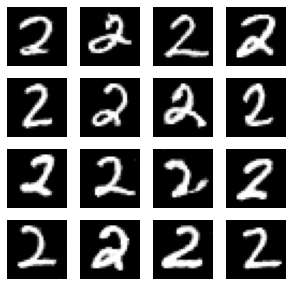

4/4 [==============================] - 0s 3ms/step
15800, [D loss: 0.173856, acc.: 0.17%], [G loss: 3.810836]
1/1 [==============================] - 0s 25ms/step


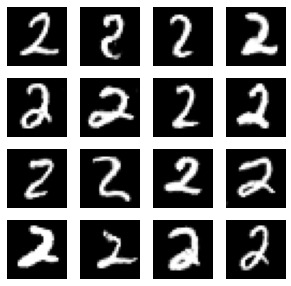

4/4 [==============================] - 0s 4ms/step
15900, [D loss: 0.128603, acc.: 0.13%], [G loss: 4.404287]
1/1 [==============================] - 0s 21ms/step


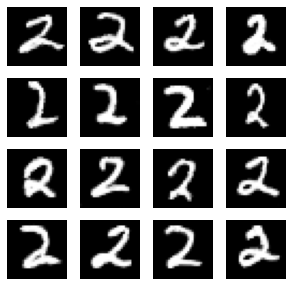

4/4 [==============================] - 0s 4ms/step
16000, [D loss: 0.236247, acc.: 0.24%], [G loss: 3.526037]
1/1 [==============================] - 0s 27ms/step


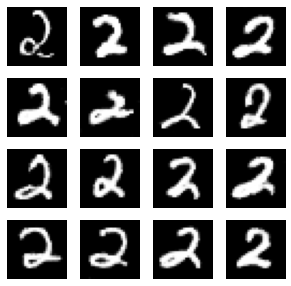

4/4 [==============================] - 0s 4ms/step


KeyboardInterrupt: ignored

In [12]:
#그리고 포문
for epoch in range(epochs):
    idx = np.random.randint(0, x_train.shape[0], batch_size)
    real_imgs = x_train[idx]

    z = np.random.normal(0, 1, (batch_size, noise))
    fake_imgs = generator.predict(z)

    d_hist_real = discriminator.train_on_batch(real_imgs, real)
    d_hist_fake = discriminator.train_on_batch(fake_imgs, fake)

    d_loss, d_acc = np.add(d_hist_fake, d_hist_real) * 0.5



    if epoch % 2 == 0:
        z = np.random.normal(0, 1, (batch_size, noise))
        gan_hist = gan_model.train_on_batch(z, real)

    if epoch % sample_interval == 0:
        print('%d, [D loss: %f, acc.: %.2f%%], [G loss: %f]'%(  #프린트의 괄호안의 변수, 퍼센트 찾아가는 것? 바로 아래 변수에, 디시멀 : 십진수로 출력해아, 실수로 출력해라, 소수점아래 두자리까지 출력, 플롯(실수)로 출력해랴. => 프린트에서만 먹히는 포맷함수?
                    epoch, d_loss, d_loss, gan_hist))
        row = col = 4
        z = np.random.normal(0, 1, (row * col, noise))
        fake_imgs = generator.predict(z)
        fake_imgs = 0.5 * fake_imgs + 0.5
        _, axs = plt.subplots(row, col, figsize=(5, 5), sharey=True, sharex=True)
        cont = 0
        for i in range(row):
            for j in range(col):
                axs[i, j].imshow(fake_imgs[cont, :, :, 0], cmap='gray')
                axs[i, j].axis('off')
                cont += 1
        path = os.path.join(OUT_DIR, 'img-{}'.format(epoch+1))
        plt.savefig(path)
        plt.show()          # 보여주고 저장하며 덮어쓰기
        plt.close()
        generator.save('/content/drive/MyDrive/Colab Notebooks/GAN_models/GAN_models/generator_mnist_{}.h5'.format(MY_NUMBER))     #현재폴더가 컨텐트, 마운트 시킨 드라이브 폴더에 폴더만들어서 경로


In [13]:
generator.save('/content/drive/MyDrive/Colab Notebooks/GAN_models/GAN_models/generator_mnist_{}.h5'.format(MY_NUMBER))     #현재폴더가 컨텐트, 마운트 시킨 드라이브 폴더에 폴더만들어서 경로


In [20]:
# 빈리스트 만들고 모델 10개 불러오기
number_GAN_models = []
for i in range(10):  #10개 모델이 리스트에 쭉 들어가게 될 것
    number_GAN_models.append(load_model(
        '/content/drive/MyDrive/Colab Notebooks/GAN_models/GAN_models/generator_mnist_{}.h5'.format(i)))

In [21]:
four_digit_number = '1234' #엠리스트에 없는 이미지 만들어내는. 간모델중 제너는 앱리스트 본 적 없

In [38]:
imgs = []
for i in four_digit_number:
    i = int(i)
    z = np.random.normal(0, 1, (1, 100))
    fake_img = number_GAN_models[i].predict(z)     # 값 줘서 이미지 만들게 하고
    fake_img = 0.5 * fake_img + 0.5
    print(fake_img.shape)
    imgs.append(fake_img.reshape(28, 28))          # ㅑㅡㅎㄴdp 4ro wlqdjsjgsms 4개집어넣는




1/1 [==============================] - 0s 16ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)


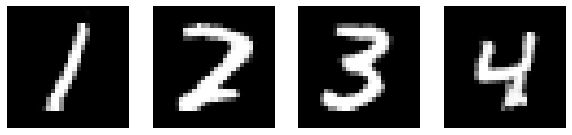

In [39]:
_, axs = plt.subplots(1, 4, figsize=(10, 40), sharex=True, sharey=True)
for i in range(4):
    axs[i].imshow(imgs[i], cmap='gray')
    axs[i].axis('off')
plt.show()

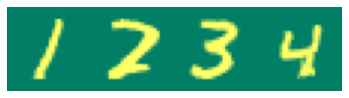

In [40]:
#4개 그림 합쳐서 하나의 이미지로 만들어보겠
img = imgs[0]
for i in range(1, 4):
    img = np.append(img, imgs[i], axis=1)
#이어붙인다음에
plt.plasma #색 컬러맵으로 바꾼
plt.imshow(img)
plt.axis('off')
plt.show()



2365
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 14ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)
1/1 [==============================] - 0s 15ms/step
(1, 28, 28, 1)


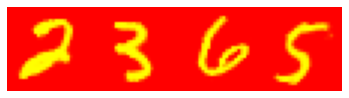

In [44]:
# 사용자 입력을 받아서
input_value = input() #사용자에게 입력받은 이미지를 손글씨로 출력해주는 것
imgs = []
for i in input_value:
    i = int(i)
    z = np.random.normal(0, 1, (1, 100))
    fake_img = number_GAN_models[i].predict(z)
    fake_img = 0.5 + fake_img + 0.5
    print(fake_img.shape)
    imgs.append(fake_img.reshape(28, 28))
img = imgs[0]
for i in range(1, len(input_value)):
    img = np.append(img, imgs[i], axis=1)
plt.autumn()          #색 컬러맵으로 바꾼
plt.imshow(img)
plt.axis('off')
plt.show()


In [ ]:

# lrelu = LeakyReLU(alpha=0.01) # 디폴트 값 : 0.3

# discriminator = Sequential()
# discriminator.add(Conv2D(32, kenel_size=3, strides=2, padding='same', input_shape=img_shape))
# discriminator.add(LeakyReLU(alpha=0.01))
# #맥스풀 생략 위에서 strides를 줬기 때문에
# discriminator.add(Conv2D(64, kenel_size=3, strides=2, padding='same'))  #레이어더쌓, 키워나가겠습니다
# discriminator.add(LeakyReLU(alpha=0.01))
# discriminator.add(Conv2D(128, kenel_size=3, strides=2, padding='same'))  #레이어더쌓, 키워나가겠습니다
# discriminator.add(LeakyReLU(alpha=0.01))
# discriminator.add(Flatten())# 덴스레이어 들어가야하니 flatten
# discriminator.add(Dense(1, activation='sigmoid'))
# discriminator.summary()




# discriminator.add(Flatten(input_shape=img_shape))
# discriminator.add(Dense(128, activation=lrelu))
# discriminator.add(Dense(1, activation='sigmoid'))
# discriminator.summary()
# discriminator.compile(loss='binary_crossentropy', optimizer='adam',
#                       metrics=['accuracy'])

# gan_model = Sequential()
# gan_model.add(generator)
# gan_model.add(discriminator)
# gan_model.summary()
# gan_model.compile(loss='binary_crossentropy', optimizer='adam')

# real = np.ones((batch_size, 1))     # np.ones : 1로 채워진 행렬로 만들어 주는 것
# #print(real)
# fake = np.zeros((batch_size, 1))
# #print(fake)

# for epoch in range(epochs):
#     idx = np.random.randint(0, x_train.shape[0], batch_size)    # 0-59999 랜덤으로 뽑아냄
#     real_imgs = x_train[idx]

#     z = np.random.normal(0, 1, (batch_size, noise))
#     fake_imgs = generator.predict(z)

#     d_hist_real = discriminator.train_on_batch(real_imgs, real)    # train_on_batch: 1회만 하고 그만둠
#     d_hist_fake = discriminator.train_on_batch(fake_imgs, fake)

#     d_loss, d_acc = np.add(d_hist_fake, d_hist_real) * 0.5  # 평균을 구함

#     discriminator.trainable = False

#     z = np.random.normal(0, 1, (batch_size, noise))
#     gan_hist = gan_model.train_on_batch(z, real) # 1이라고 답하게 학습

#     if epoch % sample_interval ==0:
#         print('%d, [D loss: %f, acc.: %.2f%%], [G loss: %f]'%(
#             epoch, d_loss, d_loss, gan_hist))
#         row = col = 4
#         z = np.random.normal(0, 1 ,(row*col, noise))
#         fake_imgs = generator.predict(z)
#         fake_imgs = 0.5 * fake_imgs + 0.5

#         _, axs = plt.subplots(row, col, figsize=(5, 5),sharey =True, sharex=True)
#         cont = 0
#         for i in range(row):
#             for j in range(col):
#                 axs[i, j].imshow(fake_imgs[cont, :, :, 0], cmap='gray')
#                 axs[i, j].axis('off')
#                 cont += 1
#         path = os.path.join(OUT_DIR, 'img-{}'.format(epoch + 1))
#         plt.savefig(path)
#         plt.close()
